### Ejercicio 1: Preparación del Ambiente de Trabajo
- Importe las librerías básicas.
- Importe los métodos asociados a regularización.
- Importe la base de datos.


In [4]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("darkgrid")
plt.rcParams["figure.figsize"] = (10, 6) # Tamaño gráficos
plt.rcParams["figure.dpi"] = 200 # resolución gráficos

from sklearn.metrics import mean_squared_error, median_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression
from sklearn.linear_model import RidgeCV, LassoCV, ElasticNetCV

import warnings
warnings.filterwarnings('ignore')

import sys
sys.path.append('../utils/')
from calidad_datos import calidad_datos as cal

In [9]:
df = pd.read_csv('winequality-red.csv')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


#### Ejercicio 2: Análisis exploratorio
- Identifique el tipo de datos de cada columna.
- Identifique outliers univariados y multivariados.
    - Los primeros los puede encontrar realizando boxplots de cada atributo.
    - Los segundos estudiando los scatterplot entre pares de atributos.

In [12]:
# Tipos de datos
cal(df)['tipo']

quality                   int64
fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
Name: tipo, dtype: object

In [13]:
# Analisis de tipos de datos
#df.describe().round(4)
cal(df)

,tipo,nulos,porc_nulos,ceros,porc_ceros,count,mean,std,min,25%,50%,75%,max,limit_inf,limit_sup,outliers
quality,int64,0,0.0,0,0.000000,1599.0,5.636023,0.807569,3.00000,5.0000,6.00000,6.000000,8.00000,4.424668,6.847377,280
fixed acidity,float64,0,0.0,0,0.000000,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000,5.707993,10.931282,183
volatile acidity,float64,0,0.0,0,0.000000,1599.0,0.527821,0.179060,0.12000,0.3900,0.52000,0.640000,1.58000,0.259231,0.796410,164
citric acid,float64,0,0.0,132,0.082552,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000,-0.021226,0.563177,113
residual sugar,float64,0,0.0,0,0.000000,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000,0.423913,4.653698,89
chlorides,float64,0,0.0,0,0.000000,1599.0,0.087467,0.047065,0.01200,0.0700,0.07900,0.090000,0.61100,0.016869,0.158064,63
free sulfur dioxide,float64,0,0.0,0,0.000000,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000,0.184686,31.565157,143
total sulfur dioxide,float64,0,0.0,0,0.000000,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000,-2.875194,95.810779,148
density,float64,0,0.0,0,0.000000,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369,0.993916,0.999578,221
pH,float64,0,0.0,0,0.000000,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000,3.079533,3.542693,195


In [14]:
#outliers según función de calidad de datos
cal(df)['outliers']

quality                 280
fixed acidity           183
volatile acidity        164
citric acid             113
residual sugar           89
chlorides                63
free sulfur dioxide     143
total sulfur dioxide    148
density                 221
pH                      195
sulphates               107
alcohol                 148
Name: outliers, dtype: int32

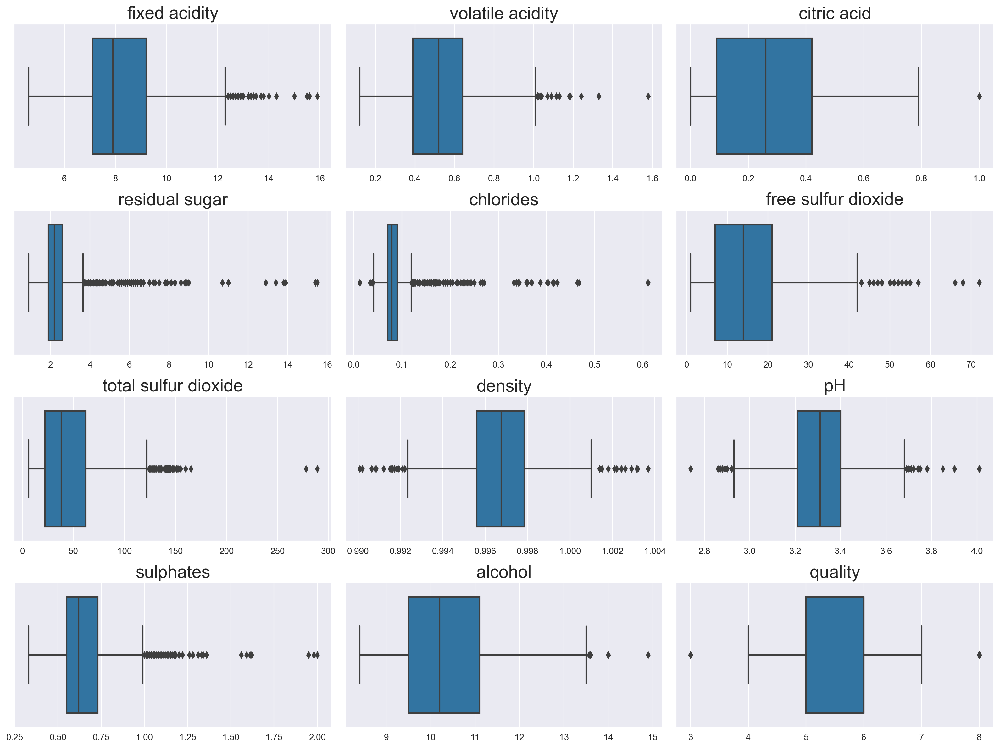

In [7]:
#Analisis de outliers por cada variables:
cols = 3
rows = int(df.shape[1] / cols)
size_fact = 4
plt.figure(figsize=(rows*size_fact, cols*size_fact))
for i, col in enumerate(df.columns):
    plt.subplot(rows, cols, i + 1)
    sns.boxplot(df[col])
    plt.title(col, fontsize=20 )
    plt.xlabel('')
    plt.tight_layout()

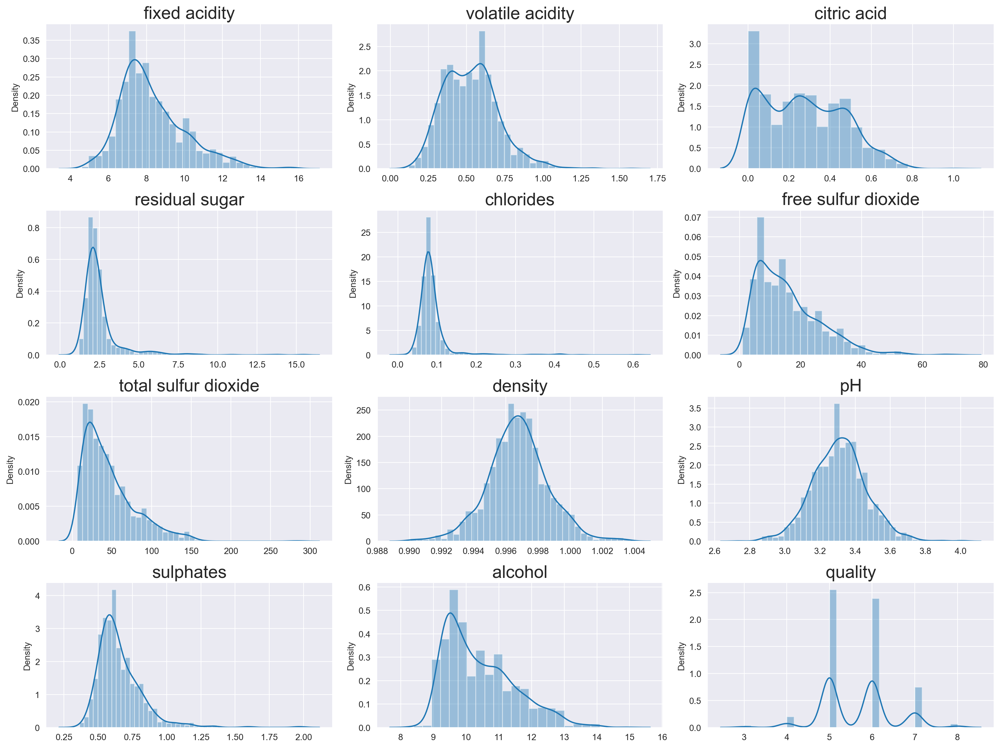

In [15]:
#Analisis contra densidad (Density):
cols = 3
rows = int(df.shape[1] / cols)
size_fact = 4
plt.figure(figsize=(rows*size_fact, cols*size_fact))
for i, col in enumerate(df.columns):
    plt.subplot(rows, cols, i + 1)
    sns.distplot(df[col])
    plt.title(col, fontsize=20)
    plt.xlabel('')
    plt.tight_layout()

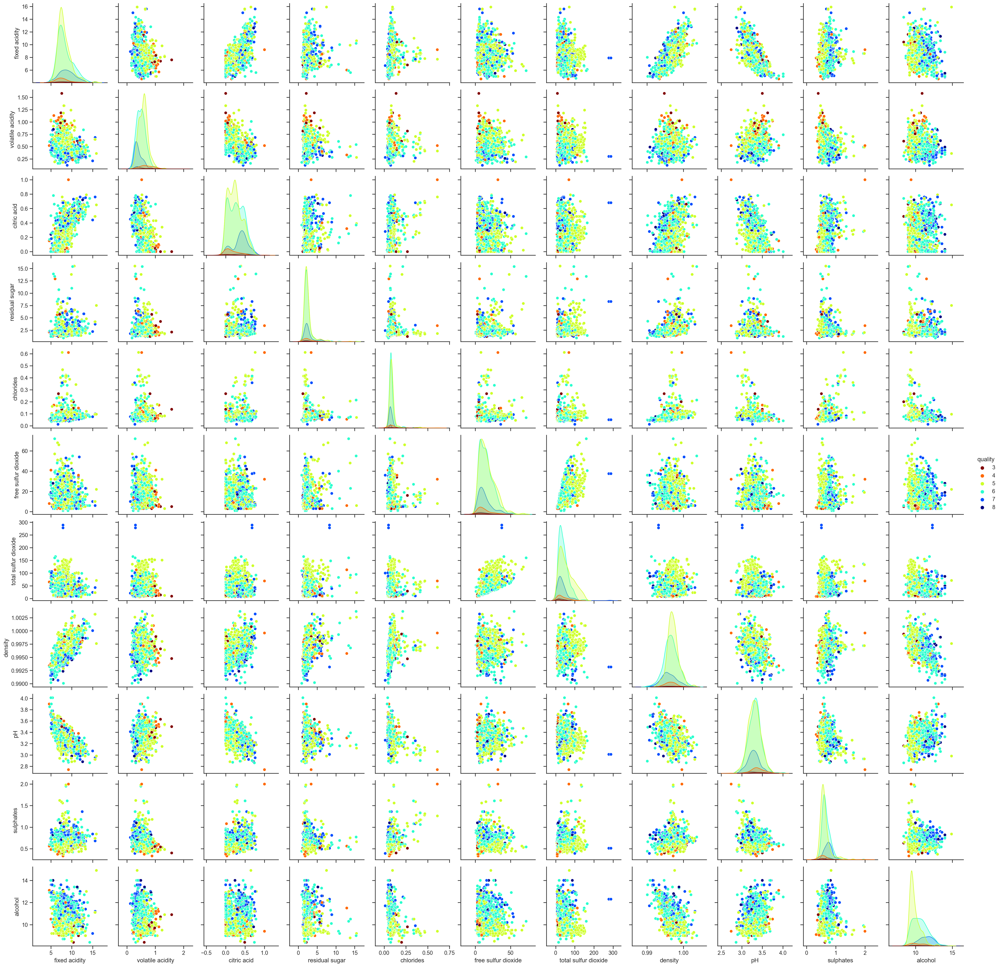

In [20]:
#Analisis bivariadas por pares con respecto a Calidad del vino (quiality)
sns.set(style="ticks") 
sns.pairplot(df, hue="quality", palette='jet_r')

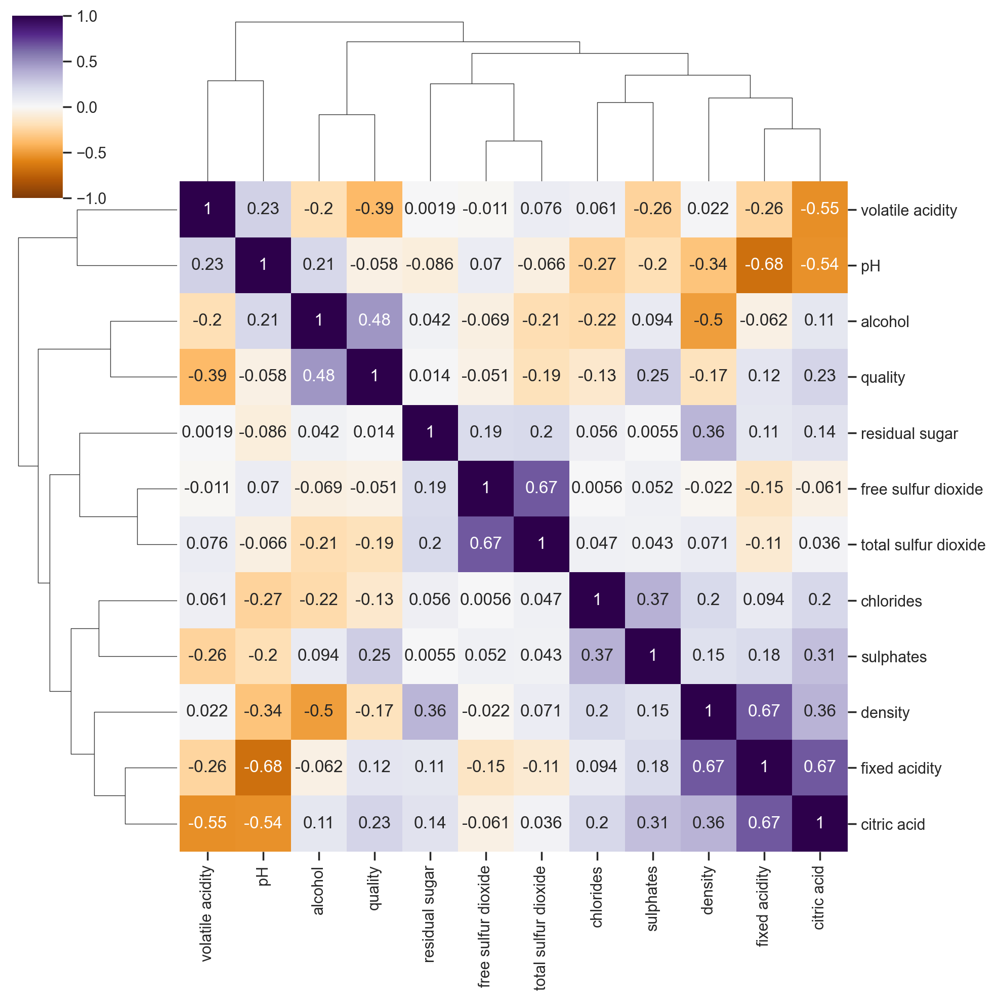

In [22]:
#Analisis de correlaciones 
sns.clustermap(df.corr(),cbar_kws={"shrink":.5}, cmap="PuOr", vmin=-1, vmax=1, annot=True)

#### Ejercicio 3: Regularización de modelos

Genere tres modelos, correspondientes a RidgeCV , LassoCV y ElasticNetCV. Para cada uno de ellos implemente los siguientes pasos:
- Entrene los modelos con 10 validaciones cruzadas.
- Extraiga los coeficientes estimados, el mejor valor alpha, MAE (median_absolute_error) y RMSE (raiz cuadrada de mean_squared_error) asociado a cada modelo.
- En base a la información solicitada, responda lo siguiente:
- ¿Qué modelo presenta un mejor desempeño en base a las métricas?
- ¿Qué atributos mantienen un comportamiento similar a lo largo de cada modelo?


In [25]:
# Se escala la data para mantener dimencionalidad
scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df), columns = df.columns)
#df_scaled['intercept'] = 1

#Se separa la data de entrenamiento y pruebas
x_train, x_test, y_train, y_test = train_test_split( df_scaled.iloc[:, :-1], df_scaled.iloc[:,-1], test_size = 0.25, shuffle=True, random_state = 42)

In [37]:
# para comparar los resultados de los coeficientes
x_train.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

In [28]:
# Modelo con regresion lineal

linear_reg = LinearRegression()
linear_reg.fit(x_train, y_train)
linear_mae = median_absolute_error(linear_reg.predict(x_test), y_test)
linear_rmse = np.sqrt(mean_squared_error(linear_reg.predict(x_test), y_test))
#print('Valor del parámetro de regularización: {0}'.format(linear_reg.alpha_)) #da error porque no tiene atributo alpha_
print('Coeficientes finales: \n{0}'.format(linear_reg.coef_))
print('RMSE de pruebas: {0}'.format(linear_rmse))
print('MAE de pruebas: {0}'.format(linear_mae))

Coeficientes finales: 
[ 0.04712959 -0.22365466 -0.03230024  0.01546762 -0.10231545  0.06487381
 -0.14885171 -0.03791555 -0.06575238  0.17207822  0.37770634]
RMSE de pruebas: 0.7718637339801693
MAE de pruebas: 0.507859913032731


In [30]:
# Modelo RidgeCV  con 10 validaciones (cv=10)

ridge_cv = RidgeCV(cv=10)
model_ridge = ridge_cv.fit(x_train, y_train)
ridge_mae = median_absolute_error(model_ridge.predict(x_test), y_test)
ridge_rmse = np.sqrt(mean_squared_error(model_ridge.predict(x_test),
y_test))
print('Valor del parámetro de regularización: {0}'.format(model_ridge.alpha_))
print('Coeficientes finales: \n{0}'.format(model_ridge.coef_))
print('RMSE de pruebas: {0}'.format(ridge_rmse))
print('MAE de pruebas: {0}'.format(ridge_mae))

Valor del parámetro de regularización: 10.0
Coeficientes finales: 
[ 0.05171984 -0.22122281 -0.02862004  0.01735463 -0.10189407  0.06280238
 -0.14710856 -0.04461045 -0.06103819  0.17180412  0.37102758]
RMSE de pruebas: 0.7719574117959531
MAE de pruebas: 0.5049691736036988


In [31]:
# Modelo LassoCV con 10 validaciones (cv=10)

lasso_cv = LassoCV(cv=10)
model_lasso = lasso_cv.fit(x_train, y_train)
lasso_mae = median_absolute_error(model_lasso.predict(x_test), y_test)
lasso_rmse = np.sqrt(mean_squared_error(model_lasso.predict(x_test),
y_test))
print('Valor del parámetro de regularización: {0}'.format(model_lasso.alpha_))
print('Coeficientes finales: \n{0}'.format(model_lasso.coef_))
print('RMSE de pruebas: {0}'.format(lasso_rmse))
print('MAE de pruebas: {0}'.format(lasso_mae))

Valor del parámetro de regularización: 0.011266843992228975
Coeficientes finales: 
[ 0.         -0.21485994 -0.          0.         -0.09162251  0.03463127
 -0.12215256 -0.         -0.05820333  0.15389476  0.38731718]
RMSE de pruebas: 0.7751017515608977
MAE de pruebas: 0.5189379130363738


In [32]:
# Modelo ElasticNetCV con 10 validaciones (cv=10)

enet_cv = ElasticNetCV(cv=10) # alpha [norma1], beta [ norma 2]
# alpha, ratio
model_enet = enet_cv.fit(x_train, y_train)
enet_mae = median_absolute_error(model_enet.predict(x_test), y_test)
enet_rmse = np.sqrt(mean_squared_error(model_enet.predict(x_test), y_test))
print('Valor del parámetro de regularización: {0}'.format(model_enet.alpha_))
print('Coeficientes finales: \n{0}'.format(model_enet.coef_))
print('RMSE de pruebas: {0}'.format(enet_rmse))
print('MAE de pruebas: {0}'.format(enet_mae))

Valor del parámetro de regularización: 0.019598652649782625
Coeficientes finales: 
[ 0.         -0.21395852 -0.          0.         -0.09322958  0.03754834
 -0.12505964 -0.         -0.05942415  0.15469553  0.38456393]
RMSE de pruebas: 0.7749040231817501
MAE de pruebas: 0.5182080941600193


#### Gráficos de los modelos 

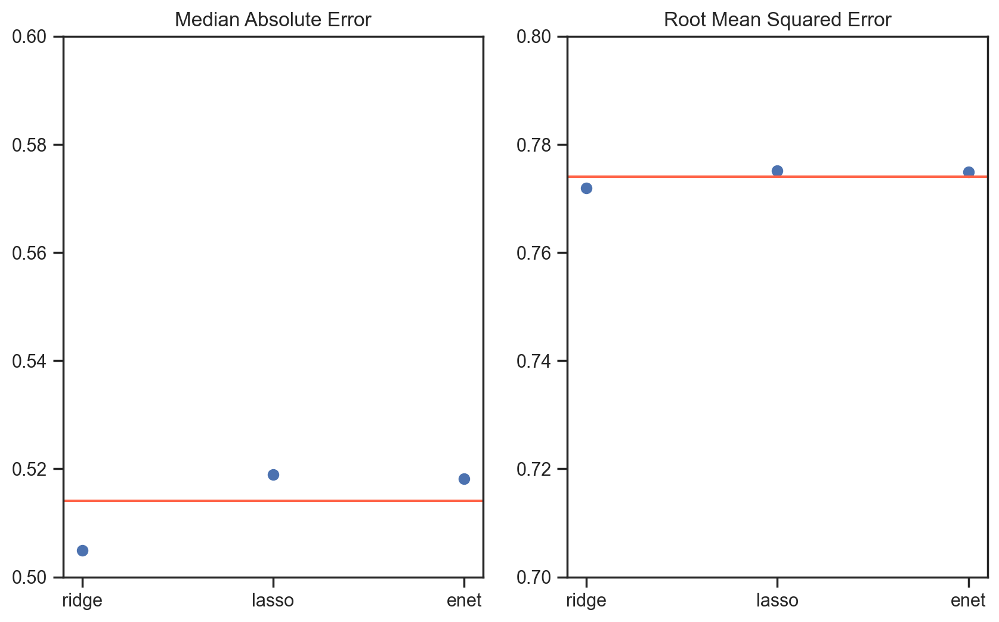

In [33]:
plt.subplot(1, 2, 1)
plt.plot(['ridge', 'lasso', 'enet'], [ridge_mae, lasso_mae, enet_mae],
'o')
plt.axhline(np.mean([ridge_mae, lasso_mae, enet_mae]), color='tomato')
plt.ylim(.5, .6)
plt.title('Median Absolute Error')
plt.subplot(1, 2, 2)
plt.plot(['ridge', 'lasso', 'enet'],[ridge_rmse, lasso_rmse, enet_rmse],
'o')
plt.axhline(np.mean([ridge_rmse, lasso_rmse, enet_rmse]),
color='tomato')
plt.ylim(.7, .8)
plt.title('Root Mean Squared Error');

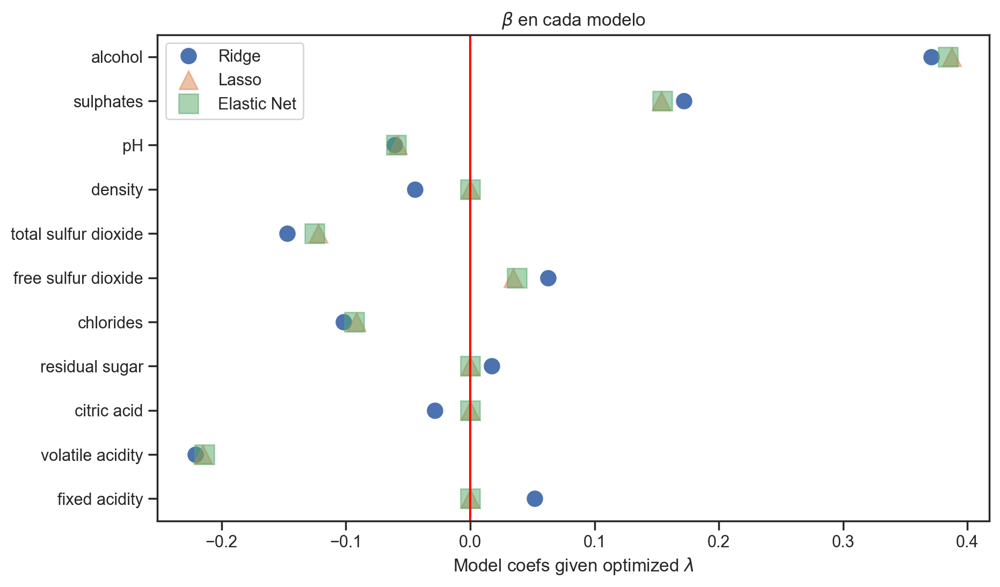

In [34]:
comparecoefs = pd.DataFrame({'ridge':model_ridge.coef_, 'lasso':
model_lasso.coef_, 'enet':
model_enet.coef_})
comparecoefs['coefs'] = df.columns.drop('quality')
plt.plot(comparecoefs['ridge'],comparecoefs['coefs'], 'o',
label='Ridge', markersize=10)
plt.plot(comparecoefs['lasso'],comparecoefs['coefs'], '^', alpha=.5,
label='Lasso', markersize=12)
plt.plot(comparecoefs['enet'],comparecoefs['coefs'], 's', alpha=.5,
label='Elastic Net', markersize=13)
plt.axvline(0, color='red')
plt.xlabel(r'Model coefs given optimized $\lambda$');
plt.legend()
plt.title(r'$\beta$ en cada modelo' );